# Artificial Neural Networks and Deep Learning

---

## Homework 1: Minimal Working Example

To make your first submission, follow these steps:
1. Create a folder named `[2024-2025] AN2DL/Homework 1` in your Google Drive.
2. Upload the `training_set.npz` file to this folder.
3. Upload the Jupyter notebook `Homework 1 - Minimal Working Example.ipynb`.
4. Load and process the data.
5. Implement and train your model.
6. Submit the generated `.zip` file to Codabench.


## 🌐 Connect Colab to Google Drive

In [ ]:
from google.colab import drive

drive.mount('/gdrive')
%cd /gdrive/My Drive/[2024-2025] AN2DL/Homework 1

Mounted at /gdrive
/gdrive/My Drive/[2024-2025] AN2DL/Homework 1


## ⚙️ Import Libraries

In [ ]:
import numpy as np

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

np.random.seed(42)
tf.random.set_seed(42);

In [ ]:
# Set seed for reproducibility
seed = 42

# Import necessary libraries
import os

# Set environment variables before importing modules
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np

# Set seeds for random number generators in NumPy and Python
np.random.seed(seed)
random.seed(seed)

# Import TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

# Set seed for TensorFlow
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

# Reduce TensorFlow verbosity
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

# Print TensorFlow version
print(tf.__version__)

# Import other libraries
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
from PIL import Image
import matplotlib.gridspec as gridspec

#import from Tommaso
from collections import Counter
from collections import defaultdict
import hashlib

# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

2.17.0


## ⏳ Load the Data

In [ ]:
import numpy as np

data = np.load('training_set.npz')

# Code for exploring npz content
print(data.files)
for key in data.files:
    array = data[key]
    print(f"Array '{key}':")
    print(f"  Shape: {array.shape}")
    print(f"  Data Type: {array.dtype}")
   #print(f"  First few elements:\n{array[:5]}\n")


#arrays
X = data['images']
y = data['labels']

# Define a mapping of labels to their corresponding cell type names
labels = {
    0: 'Basophil',
    1: 'Eosinophil',
    2: 'Erythroblast',
    3: 'Immature granulocytes',
    4: 'Lymphocyte',
    5: 'Monocyte',
    6: 'Neutrophil',
    7: 'Platelet'
}
# Save unique labels
unique_labels = list(labels.values())

['images', 'labels']
Array 'images':
  Shape: (13759, 96, 96, 3)
  Data Type: uint8
Array 'labels':
  Shape: (13759, 1)
  Data Type: uint8


🔎 Inspect Data

In [ ]:
# Print the shapes of the loaded datasets
print("Training-Validation Data Shape:", X.shape)
print("Training-Validation Label Shape:", y.shape)

# Conta le occorrenze di ogni etichetta
label_counts = Counter(y.flatten())  # Usa flatten() per rendere y monodimensionale

# Stampa i risultati
for label, count in label_counts.items():
    print(f"{labels[label]}: {count}")

Training-Validation Data Shape: (13759, 96, 96, 3)
Training-Validation Label Shape: (13759, 1)
Platelet: 1843
Immature granulocytes: 2226
Neutrophil: 2530
Erythroblast: 1285
Eosinophil: 2381
Monocyte: 1393
Basophil: 1052
Lymphocyte: 1049


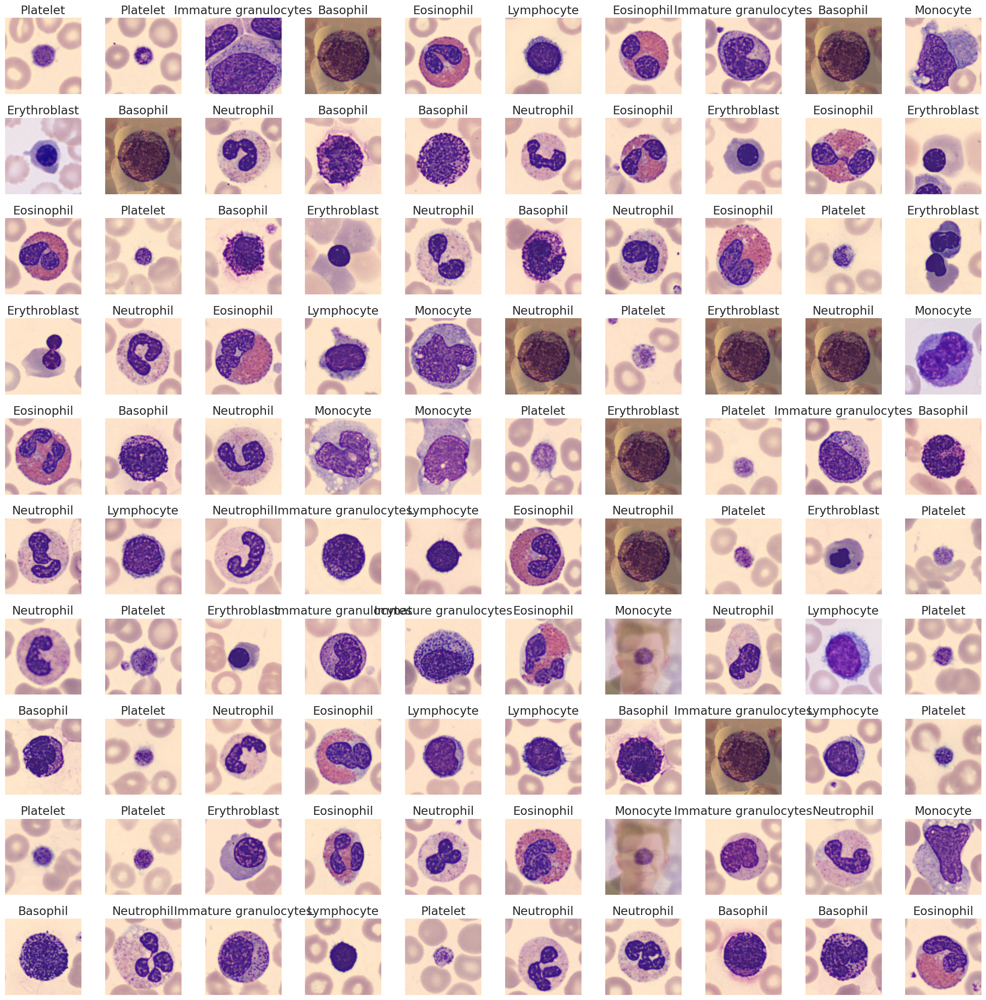

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Imposta il numero di immagini da visualizzare
num_img = 100
random_indices = random.sample(range(len(X)), num_img)

# Calcola il numero di righe e colonne per la griglia
num_cols = 10  # Impostiamo 10 immagini per riga
num_rows = num_img // num_cols

# Crea una griglia per visualizzare le immagini
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 20))

# Itera attraverso il numero di immagini selezionate
for i, idx in enumerate(random_indices):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    ax.imshow(np.squeeze(X[idx]), vmin=0., vmax=1.)
    ax.set_title(f'{labels[y[idx][0]]}')
    ax.axis('off')



# Aggiusta il layout e visualizza le immagini
plt.tight_layout()
plt.show()

In [ ]:

# Dizionario per memorizzare gli hash delle immagini e le etichette corrispondenti
image_hashes = defaultdict(list)

# Funzione per calcolare un hash unico per un'immagine
def get_image_hash(image):
    return hashlib.md5(image.tobytes()).hexdigest()

# Popola il dizionario con hash delle immagini e le etichette
for i, img in enumerate(X):
    img_hash = get_image_hash(img)
    image_hashes[img_hash].append(y[i][0])  # y[i][0] per ottenere l'etichetta come valore singolo

# Cerca immagini con etichette diverse
duplicates_with_diff_labels = {hash_: label_list for hash_, label_list in image_hashes.items() if len(set(label_list)) > 1}

# Cerca immagini duplicate, anche se hanno la stessa etichetta
duplicates_with_multiple_labels = {hash_: label_list for hash_, label_list in image_hashes.items() if len(label_list) > 1}

# Stampa i risultati per immagini duplicate con etichette diverse
if duplicates_with_diff_labels:
    print("Immagini duplicate con etichette diverse trovate:")
    for hash_, label_list in duplicates_with_diff_labels.items():
        image_count = len(label_list)  # Conta quante volte l'immagine appare
        print(f"Hash: {hash_}, Etichette trovate: {set(label_list)}, Occorrenze: {image_count}")
else:
    print("Nessuna immagine duplicata con etichette diverse trovata.")

# Stampa i risultati per immagini duplicate, anche se hanno la stessa etichetta
if duplicates_with_multiple_labels:
    print("Immagini duplicate trovate (anche con la stessa etichetta):")
    for hash_, label_list in duplicates_with_multiple_labels.items():
        image_count = len(label_list)  # Conta quante volte l'immagine appare
        print(f"Hash: {hash_}, Etichette trovate: {set(label_list)}, Occorrenze: {image_count}")
else:
    print("Nessuna immagine duplicata trovata.")



Immagini duplicate con etichette diverse trovate:
Hash: 6cf0f392e57a6c16165d9b84c885ff78, Etichette trovate: {0, 1, 2, 3, 4, 5, 6, 7}, Occorrenze: 1600
Immagini duplicate trovate (anche con la stessa etichetta):
Hash: d5dd027c53115329e3ae38255636b002, Etichette trovate: {3}, Occorrenze: 2
Hash: 7d886eea58027fdf845dae148f2c58ee, Etichette trovate: {0}, Occorrenze: 2
Hash: 925d5dc55eecab7e2f3c9d83a281634f, Etichette trovate: {1}, Occorrenze: 2
Hash: 96db0569d5cbdab3bbd527551002138a, Etichette trovate: {0}, Occorrenze: 2
Hash: f39a51aa0f212ab7288df2aba5fc8a6e, Etichette trovate: {3}, Occorrenze: 2
Hash: 1e26f78cdf123cb948fdca2aacd18049, Etichette trovate: {3}, Occorrenze: 2
Hash: d94ef7d729ff6e7ec3c6349c14d602df, Etichette trovate: {1}, Occorrenze: 2
Hash: 06c86bed6d52d0fd55f12db4a4ad7d1c, Etichette trovate: {5}, Occorrenze: 2
Hash: 6cf0f392e57a6c16165d9b84c885ff78, Etichette trovate: {0, 1, 2, 3, 4, 5, 6, 7}, Occorrenze: 1600
Hash: e2a4597c107ff8683737443da52bfb58, Etichette trovate: {5}

Mostra un esempio per ogni immagine duplicata:


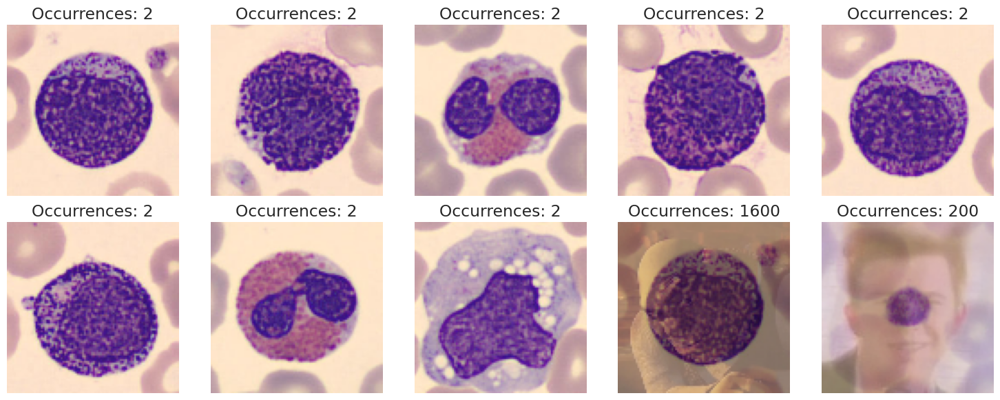

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Funzione per visualizzare un esempio per ogni immagine duplicata
def display_duplicates(duplicates):
    num_images = len(duplicates)
    cols = 5  # Numero di colonne per la griglia
    rows = (num_images // cols) + (1 if num_images % cols != 0 else 0)  # Calcola le righe in base al numero di immagini

    # Impostiamo una dimensione della figura che non sia troppo piccola
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))  # Cambia il fattore di ingrandimento per dimensioni migliori
    axes = axes.flatten()  # Flatten l'array degli assi per un accesso facile

    ax_index = 0
    for hash_, labels in duplicates.items():
        indices = [idx for idx, _ in enumerate(X) if get_image_hash(X[idx]) == hash_]
        example_idx = indices[0]  # Seleziona la prima immagine come esempio

        # Visualizza solo l'immagine senza le etichette nel titolo
        ax = axes[ax_index]  # Seleziona l'asse corrispondente
        ax.imshow(np.squeeze(X[example_idx]), vmin=0., vmax=1.)
        ax.set_title(f"Occurrences: {len(labels)}")  # Non stampiamo le etichette, solo il numero di occorrenze
        ax.axis('off')

        ax_index += 1

    # Nascondi gli assi inutilizzati (se il numero di immagini non è un multiplo esatto di cols)
    for i in range(ax_index, len(axes)):
        axes[i].axis('off')

    # Aggiusta la disposizione per evitare sovrapposizioni
    plt.tight_layout()
    plt.show()

# Stampa i risultati per immagini duplicate, anche con la stessa etichetta
if duplicates_with_multiple_labels:
    print("Mostra un esempio per ogni immagine duplicata:")
    display_duplicates(duplicates_with_multiple_labels)
else:
    print("Nessuna immagine duplicata trovata.")


In [1]:
# Funzione per rimuovere tutte le occorrenze delle immagini con etichette multiple dal dataset
def remove_duplicates(X, y, duplicates_with_multiple_labels, duplicates_with_diff_labels):

    # Prepara una lista per gli indici delle immagini da eliminare
    indices_to_remove = set()

    # Trova gli indici delle immagini duplicate con etichette diverse
    for hash_, labels in duplicates_with_diff_labels.items():
        indices = [idx for idx, _ in enumerate(X) if get_image_hash(X[idx]) == hash_]

        # Rimuovi tutte le occorrenze tranne la prima (con etichette diverse)
        indices_to_remove.update(indices)

    # Trova gli indici delle immagini duplicate con etichette multiple o con la stessa etichetta
    for hash_, labels in duplicates_with_multiple_labels.items():
        indices = [idx for idx, _ in enumerate(X) if get_image_hash(X[idx]) == hash_]

        if len(labels) > 100:
            # Rimuovi tutte le occorrenze (eliminamo rick astley)
            indices_to_remove.update(indices)
        else:
            # Mantieni solo una occorrenza per le immagini con la stessa etichetta
            indices_to_remove.update(indices[1:])  # Lascia solo la prima occorrenza




    # Rimuovi le immagini duplicate
    X_filtered = np.delete(X, list(indices_to_remove), axis=0)  # Rimuove le immagini dal dataset
    y_filtered = np.delete(y, list(indices_to_remove), axis=0)  # Rimuove le etichette corrispondenti

    return X_filtered, y_filtered

# Rimuovi tutte le immagini duplicate con etichette multiple dal dataset
X_filtered, y_filtered = remove_duplicates(X, y, duplicates_with_multiple_labels, duplicates_with_diff_labels)

# Mostra le dimensioni del nuovo dataset dopo la rimozione
print(f"Nuove dimensioni del dataset: X = {X_filtered.shape}, y = {y_filtered.shape}")

# Conta le occorrenze di ogni etichetta
label_counts = Counter(y.flatten())  # Usa flatten() per rendere y monodimensionale

# Stampa i risultati
for label, count in label_counts.items():
    print(f"{labels[label]}: {count}")

NameError: name 'X' is not defined

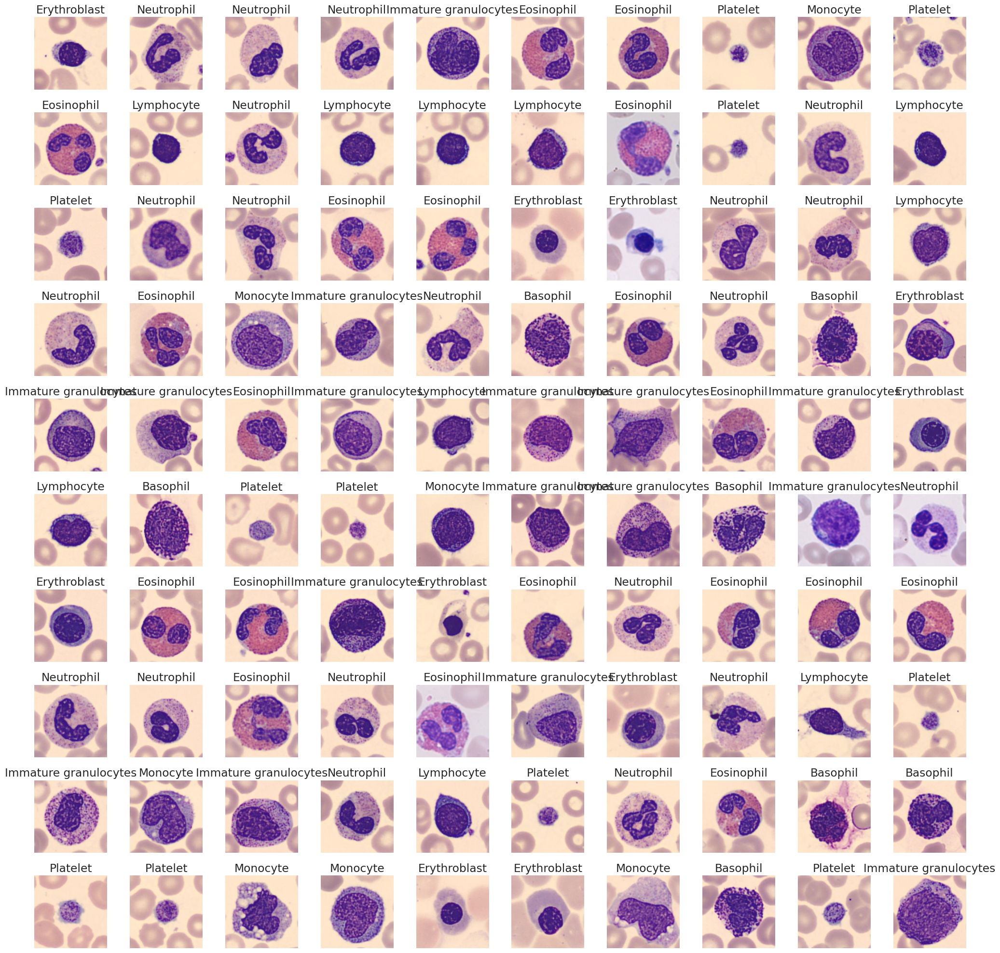

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Imposta il numero di immagini da visualizzare
num_img = 100
random_indices = random.sample(range(len(X_filtered)), num_img)  # Usa X_filtered

# Calcola il numero di righe e colonne per la griglia
num_cols = 10  # Impostiamo 10 immagini per riga
num_rows = num_img // num_cols

# Crea una griglia per visualizzare le immagini
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 20))

# Itera attraverso il numero di immagini selezionate
for i, idx in enumerate(random_indices):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    ax.imshow(np.squeeze(X_filtered[idx]), vmin=0., vmax=1.)  # Usa X_filtered
    ax.set_title(f'{labels[y_filtered[idx][0]]}')  # Usa y_filtered
    ax.axis('off')

# Aggiusta il layout e visualizza le immagini
plt.tight_layout()
plt.show()


In [ ]:
# Salva X_filtered e y_filtered in un file npz
np.savez('training_set_cleaned.npz', images=X_filtered, labels=y_filtered)

print("Dataset salvato in 'training_set_cleaned.npz'")

## 🛠️ Train and Save the Model

In [ ]:
model = ...  # Add your implementation here

model.save('weights.keras')
del model

## 📊 Prepare Your Submission

To prepare your submission, create a `.zip` file that includes all the necessary code to run your model. It **must** include a `model.py` file with the following class:

```python
# file: model.py
class Model:
    def __init__(self):
        """Initialize the internal state of the model."""

    def predict(self, X):
        """Return a numpy array with the labels corresponding to the input X."""
```

The next cell shows an example implementation of the `model.py` file, which includes loading model weights from the `weights.keras` file and conducting predictions on provided input data. The `.zip` file is created and downloaded in the last notebook cell.

❗ Feel free to modify the method implementations to better fit your specific requirements, but please ensure that the class name and method interfaces remain unchanged.

In [ ]:
%%writefile model.py
import numpy as np

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl


class Model:
    def __init__(self):
        """
        Initialize the internal state of the model. Note that the __init__
        method cannot accept any arguments.

        The following is an example loading the weights of a pre-trained
        model.
        """
        self.neural_network = tfk.models.load_model('weights.keras')

    def predict(self, X):
        """
        Predict the labels corresponding to the input X. Note that X is a numpy
        array of shape (n_samples, 96, 96, 3) and the output should be a numpy
        array of shape (n_samples,). Therefore, outputs must no be one-hot
        encoded.

        The following is an example of a prediction from the pre-trained model
        loaded in the __init__ method.
        """
        preds = self.neural_network.predict(X)
        if len(preds.shape) == 2:
            preds = np.argmax(preds, axis=1)
        return preds

In [ ]:
from datetime import datetime
filename = f'submission_{datetime.now().strftime("%y%m%d_%H%M%S")}.zip'

# Add files to the zip command if needed
!zip {filename} model.py weights.keras

from google.colab import files
files.download(filename)

Ottimizzazione del codice sopra, sarebbe da riscirvere ma pace. Funziona esattamente allo stesso modo


In [ ]:
from collections import defaultdict

# Prepara un dizionario per gli hash delle immagini e le etichette
image_hashes = defaultdict(list)

# Prepara una lista per gli indici delle immagini da eliminare
indices_to_remove = set()

# Popola il dizionario con hash delle immagini e gli indici
for i, img in enumerate(X):
    img_hash = get_image_hash(img)
    image_hashes[img_hash].append(i)  # Memorizza l'indice dell'immagine

# Cerca le immagini duplicate con etichette diverse o uguali
for hash_, indices in image_hashes.items():
    if len(indices) > 1:
        # Estrai le etichette per questi indici
        labels = [y[i][0] for i in indices]

        # Se ci sono etichette diverse, rimuovi tutte le occorrenze
        if len(set(labels)) > 1:
            indices_to_remove.update(indices)
        else:
            # Se tutte le etichette sono uguali, rimuovi tutte tranne una
            indices_to_remove.update(indices[1:])  # Rimuove tutte le occorrenze tranne la prima

# Ora, 'indices_to_remove' contiene gli indici delle immagini da eliminare
